If you want to stick with julia for plotting trees, it is possible. I might recommend using ggtree in R for plotting though.

In [1]:
using DrWatson
@quickactivate "Doran_etal_2022"
researchdir() = joinpath(projectdir(), "_research")

researchdir (generic function with 1 method)

In [2]:
using Phylo
using NewickTreeTools
using Muon, CSV, DataFrames
using StatsPlots

# Plot full tree

In [74]:
spitree_full = open(parsenewick, joinpath(researchdir(), "runSPIonUP7047rows", "2022-02-22_UP7047-tree.nw"))
sort!(spitree_full, rev = true)
uniprot = readh5ad(joinpath(datadir(), "exp_pro", "UP7047", "2022-02-22_UP7047.h5ad"))
rowmeta = uniprot.obs[!, :]
spitree = readnw(read(joinpath(researchdir(), "runSPIonUP7047rows", "2022-02-22_UP7047-tree.nw"), String));

In [4]:
treeorder = indexin(Phylo.getleafnames(spitree_full), rowmeta.proteomeID)
all(Phylo.getleafnames(spitree_full) .== rowmeta[treeorder,:proteomeID])

true

In [26]:
## Genus
blautia_color1 = map(prewalk(spitree)) do node
    idx = indexin(NewickTreeTools.getleafnames(node), rowmeta.proteomeID)
    all(coalesce.(rowmeta[idx, :Genus] .== "Blautia", false)) ? :red : :black
end;

weissella_color1 = map(prewalk(spitree)) do node
    idx = indexin(NewickTreeTools.getleafnames(node), rowmeta.proteomeID)
    all(coalesce.(rowmeta[idx, :Genus] .== "Weissella", false)) ? :red : :black
end;

bacteroides_color1 = map(prewalk(spitree)) do node
    idx = indexin(NewickTreeTools.getleafnames(node), rowmeta.proteomeID)
    all(coalesce.(rowmeta[idx, :Genus] .== "Bacteroides", false)) ? :red : :black
end;

escherichia_color1 = map(prewalk(spitree)) do node
    idx = indexin(NewickTreeTools.getleafnames(node), rowmeta.proteomeID)
    all(coalesce.(rowmeta[idx, :Genus] .== "Escherichia", false)) ? :red : :black
end;


## Phylum
firmicutes_color1 = map(prewalk(spitree)) do node
    idx = indexin(NewickTreeTools.getleafnames(node), rowmeta.proteomeID)
    all(coalesce.(rowmeta[idx, :Phylum] .== "Firmicutes", false)) ? :red : :black
end;

bacteroidetes_color1 = map(prewalk(spitree)) do node
    idx = indexin(NewickTreeTools.getleafnames(node), rowmeta.proteomeID)
    all(coalesce.(rowmeta[idx, :Phylum] .== "Bacteroidetes", false)) ? :red : :black
end;

proteobacteria_color1 = map(prewalk(spitree)) do node
    idx = indexin(NewickTreeTools.getleafnames(node), rowmeta.proteomeID)
    all(coalesce.(rowmeta[idx, :Phylum] .== "Proteobacteria", false)) ? :red : :black
end;

In [10]:
function Phylo.getleafnames(t::AbstractTree, n::Phylo.AbstractNode) 
    filter(n->Phylo.isleaf(t, n), Phylo.getdescendants(t, n))
end # indexin(, rowmeta.proteomeID)
function Phylo.getleafnames(t::AbstractTree, n::AbstractString) 
    filter(n->Phylo.isleaf(t, n), Phylo.getdescendants(t, n))
end # indexin(, rowmeta.proteomeID)

In [22]:
## Genus
blautia_color = map_depthfirst(:black, spitree_full) do val, node
     idx = indexin(Phylo.getleafnames(spitree_full, node), rowmeta.proteomeID)
     all(coalesce.(rowmeta[idx, :Genus] .== "Blautia", false)) ? :red : :black
 end;
 
 weissella_color = map_depthfirst(:black, spitree_full) do val, node
     idx = indexin(Phylo.getleafnames(spitree_full, node), rowmeta.proteomeID)
     all(coalesce.(rowmeta[idx, :Genus] .== "Weissella", false)) ? :red : :black
 end;
 
 bacteroides_color = map_depthfirst(:black, spitree_full) do val, node
     idx = indexin(Phylo.getleafnames(spitree_full, node), rowmeta.proteomeID)
     all(coalesce.(rowmeta[idx, :Genus] .== "Bacteroides", false)) ? :red : :black
 end;
 
 escherichia_color = map_depthfirst(:black, spitree_full) do val, node
     idx = indexin(Phylo.getleafnames(spitree_full, node), rowmeta.proteomeID)
     all(coalesce.(rowmeta[idx, :Genus] .== "Escherichia", false)) ? :red : :black
 end;
 
 
 ## Phylum
 firmicutes_color = map_depthfirst(:black, spitree_full) do val, node
     idx = indexin(Phylo.getleafnames(spitree_full, node), rowmeta.proteomeID)
     all(coalesce.(rowmeta[idx, :Phylum] .== "Firmicutes", false)) ? :red : :black
 end;
 
 bacteroidetes_color = map_depthfirst(:black, spitree_full) do val, node
     idx = indexin(Phylo.getleafnames(spitree_full, node), rowmeta.proteomeID)
     all(coalesce.(rowmeta[idx, :Phylum] .== "Bacteroidetes", false)) ? :red : :black
 end;
 
 proteobacteria_color = map_depthfirst(:black, spitree_full) do val, node
     idx = indexin(Phylo.getleafnames(spitree_full, node), rowmeta.proteomeID)
     all(coalesce.(rowmeta[idx, :Phylum] .== "Proteobacteria", false)) ? :red : :black
 end;

In [28]:
@show length(firmicutes_color)
@show length(firmicutes_color1)
@show all(firmicutes_color .== firmicutes_color1)

length(firmicutes_color) = 14093
length(firmicutes_color1) = 14093
all(firmicutes_color .== firmicutes_color1) = false


false

In [50]:
smalltree = parsenewick("((A:2,(B:2,C:2):2):2,((D:1, E:1):1,F:1):1);");

RootedTree with 6 tips, 11 nodes and 10 branches.
Leaf names are D, E, F, A, B and C


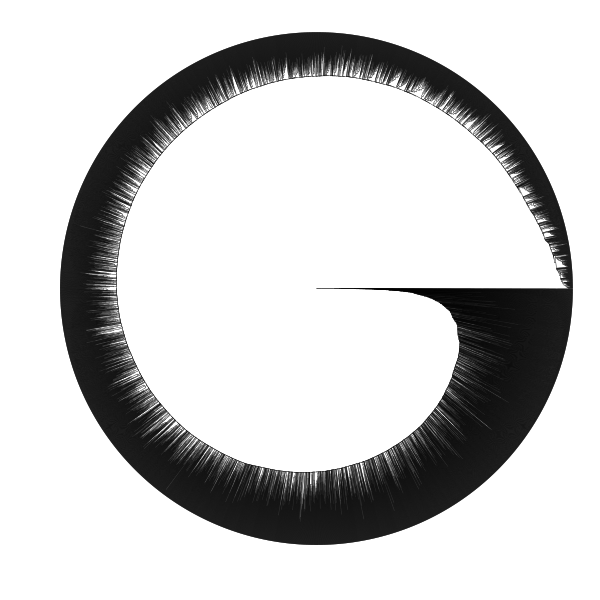

In [62]:
plot(spitree_full, treetype=:fan, 
    # linecolor = bacteroides_color, 
    size = (600, 600), 
    linewidth=.4, 
    showtips=false)

# plot network distance of several genera

In [76]:
## UPIDS for genus
bacteroidesIDs_raw = string.(rowmeta.proteomeID[coalesce.(rowmeta.Genus .== "Bacteroides", false)]);
blautiaIDs_raw = string.(rowmeta.proteomeID[coalesce.(rowmeta.Genus .== "Blautia", false)]);
escherichiaIDs_raw = string.(rowmeta.proteomeID[coalesce.(rowmeta.Genus .== "Escherichia", false)]);
weissellaIDs_raw = string.(rowmeta.proteomeID[coalesce.(rowmeta.Genus .== "Weissella", false)]);
## Species names
bacteroidesspecies = string.(rowmeta.Species[coalesce.(rowmeta.Genus .== "Bacteroides", false)]);
blautiaspecies = string.(rowmeta.Species[coalesce.(rowmeta.Genus .== "Blautia", false)]);
escherichiaspecies = string.(rowmeta.Species[coalesce.(rowmeta.Genus .== "Escherichia", false)]);
weissellaspecies = string.(rowmeta.Species[coalesce.(rowmeta.Genus .== "Weissella", false)]);

In [77]:
## Get leaf nodes for each genus
leaves = NewickTree.getleaves(spitree)
bacteroides_Nodes = leaves[map(id->∈(id,bacteroidesIDs_raw),NewickTree.name.(leaves))];
blautia_Nodes = leaves[map(id->∈(id,blautiaIDs_raw),NewickTree.name.(leaves))];
escherichia_Nodes = leaves[map(id->∈(id,escherichiaIDs_raw),NewickTree.name.(leaves))];
weissella_Nodes = leaves[map(id->∈(id,weissellaIDs_raw),NewickTree.name.(leaves))];

# bacteroides_Nodes = bacteroides_Nodes[indexin(bacteroidesIDs, name.(bacteroides_Nodes))]
# blautia_Nodes = blautia_Nodes[indexin(blautiaIDs, name.(blautia_Nodes))]
# escherichia_Nodes = escherichia_Nodes[indexin(escherichiaIDs, name.(escherichia_Nodes))]
# weissella_Nodes = weissella_Nodes[indexin(weissellaIDs, name.(weissella_Nodes))];

In [78]:
## reorder labels based on node similarity
bacteroidesIDs = bacteroidesIDs_raw[indexin(name.(bacteroides_Nodes), bacteroidesIDs_raw)]
blautiaIDs = blautiaIDs_raw[indexin(name.(blautia_Nodes), blautiaIDs_raw)]
escherichiaIDs = escherichiaIDs_raw[indexin(name.(escherichia_Nodes), escherichiaIDs_raw)]
weissellaIDs = weissellaIDs_raw[indexin(name.(weissella_Nodes), weissellaIDs_raw)]

bacteroidesspecies = bacteroidesspecies[indexin(name.(bacteroides_Nodes), bacteroidesIDs_raw)]
blautiaspecies = blautiaspecies[indexin(name.(blautia_Nodes), blautiaIDs_raw)]
escherichiaspecies = escherichiaspecies[indexin(name.(escherichia_Nodes), escherichiaIDs_raw)]
weissellaspecies = weissellaspecies[indexin(name.(weissella_Nodes), weissellaIDs_raw)];

In [79]:
DataFrame(Dict(:id=>blautiaIDs, :sp=>blautiaspecies, :node=>blautia_Nodes))

,id,node,sp
,String,Node…,String
1,UP000092574,UP000092574:3.246151;,Blautia sp. YL58
2,UP000198516,UP000198516:1.888059;,Blautia sp. SF-50
3,UP000285119,UP000285119:1.888059;,Blautia sp. OF03-15BH
4,UP000008956,UP000008956:1.60869;,[Ruminococcus] torques
5,UP000196301,UP000196301:1.699951;,Blautia sp. An46
6,UP000018204,UP000018204:1.19977;,Blautia sp. CAG:37
7,UP000018177,UP000018177:1.018366;,Blautia sp. CAG:52
8,UP000095409,UP000095409:1.302289;,Blautia obeum
9,UP000018056,UP000018056:1.302289;,Blautia sp. CAG:257


In [80]:
rowmeta[rowmeta.proteomeID .== "UP000095409", [:Species]]

,Species
,String
1,Blautia obeum


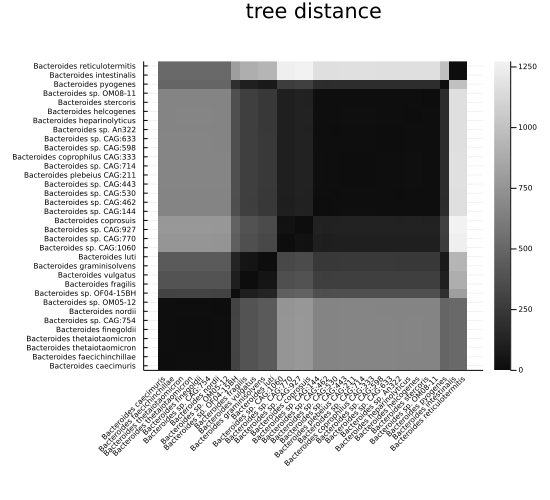

In [69]:
bacteroides_nds = network_distance.(bacteroides_Nodes, permutedims(bacteroides_Nodes))
heatmap(bacteroides_nds, 
    title="tree distance",
    ratio=1,
    size=(550,500),
    ticks=(1:length(bacteroidesIDs), bacteroidesspecies), 
    tickfontsize=5, 
    xrotation=45, 
    c=:grays, 
    # bottommargin=2Plots.Measures.mm
)

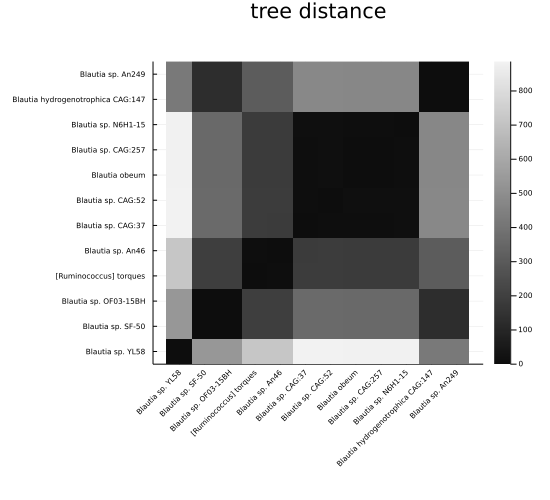

In [70]:
blautia_nds = network_distance.(blautia_Nodes, permutedims(blautia_Nodes))
heatmap(blautia_nds, 
    title="tree distance",
    ratio=1,
    size=(550,500),
    ticks=(1:length(blautiaIDs), blautiaspecies), 
    tickfontsize=5, 
    xrotation=45, 
    c=:grays, 
    # bottommargin=2Plots.Measures.mm
)

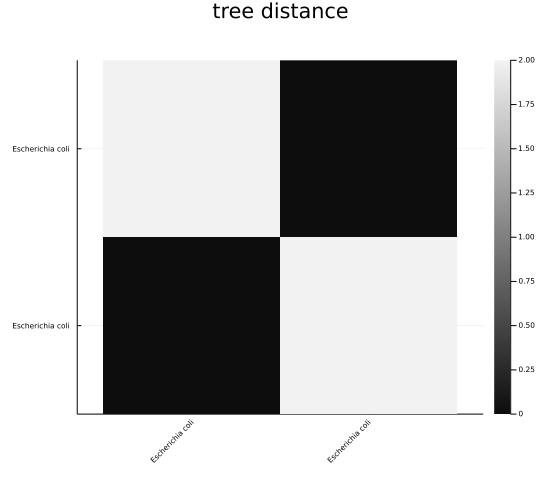

In [71]:
escherichia_nds = network_distance.(escherichia_Nodes, permutedims(escherichia_Nodes))
heatmap(escherichia_nds, 
    title="tree distance",
    ratio=1,
    size=(550,500),
    ticks=(1:length(escherichiaIDs), escherichiaspecies), 
    tickfontsize=5, 
    xrotation=45, 
    c=:grays, 
    # bottommargin=2Plots.Measures.mm
)

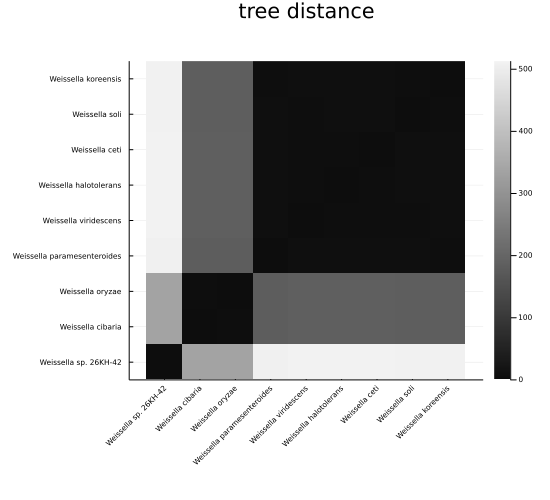

In [72]:
weissella_nds = network_distance.(weissella_Nodes, permutedims(weissella_Nodes))
heatmap(weissella_nds, 
    title="tree distance",
    ratio=1,
    size=(550,500),
    ticks=(1:length(weissellaIDs), weissellaspecies), 
    tickfontsize=5, 
    xrotation=45, 
    c=:grays, 
    # bottommargin=2Plots.Measures.mm
)

In [287]:
# hcat(bacteroidesIDs, bacteroidesspecies)

In [57]:
#  "UP000056419"  "Bacteroides stercoris" (+4)
#  "UP000003089"  "Bacteroides nordii" (+2)
#  "UP000095409"  "Blautia obeum"
#  "UP000000625"  "Escherichia coli" (+6)
#  "UP000029079"  "Weissella ceti" (+7)

In [88]:
leaf = leaves[name.(leaves) .== "UP000056419"][1]
lp = parent(leaf)
for i in 1:3
    lp = parent(lp)
end
leafparent = lp;
# subtree = collectiveLCA(spitree, blautiaIDs);
plotting_subtree = parsenewick(nwstr(leafparent))
sort!(plotting_subtree, rev=true)

RootedTree with 16 tips, 31 nodes and 30 branches.
Leaf names are UP000018018, UP000018068, UP000018372, UP000018098, UP000017916, ... [10 omitted] ... and UP000018063


In [89]:
plotIDS = getnodename.(plotting_subtree, Phylo.getleaves(plotting_subtree));
newnames = rowmeta[indexin(plotIDS,rowmeta.proteomeID), :Species];

In [90]:
rowmeta[reverse(indexin(plotIDS, rowmeta.proteomeID)), [:Phylum, :Class, :Order, :Family, :Genus, :Species]]

,Phylum,Class,Order,Family,Genus,Species
,String,String,String,String,String,String
1,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides sp. CAG:462
2,Bacteroidetes,Bacteroidia,Bacteroidales,Tannerellaceae,Tannerella,Tannerella sp. CAG:51
3,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides sp. CAG:144
4,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides sp. OM08-11
5,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides stercoris
6,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,,Bacteroidaceae bacterium HV4-6-C5C
7,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides helcogenes
8,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides heparinolyticus
9,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides sp. CAG:530


In [91]:
hcat(plotIDS,newnames);

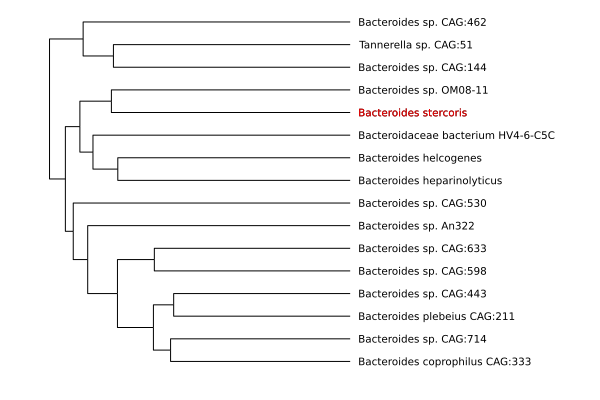

In [92]:
plot(plotting_subtree, treetype=:dendrogram, size = (600, 400), showtips=false, rightmargin=50Plots.Measures.mm)
annotate!(ones(length(plotIDS))*1.7, 1:length(plotIDS), text.(newnames, :black, :left, 7),)
annotate!(1.7, 12, text.(newnames[12], :red, :left, 7),) # bacteriodes
# annotate!(1.7, 18, text.(newnames[18], :red, :left, 7),) # blautia
# annotate!(.95, 1, text.(newnames[1], :red, :left, 7),) # weissella
# annotate!(2.5, 1, text.(newnames[1], :red, :left, 7),) # ecoli
# annotate!(2.7, 8, text.(newnames[8], :red, :left, 7),) # bacteriodes nordii

In [94]:
hcat(plotIDS, newnames)

16×2 Matrix{String}:
 "UP000018018"  "Bacteroides coprophilus CAG:333"
 "UP000018068"  "Bacteroides sp. CAG:714"
 "UP000018372"  "Bacteroides plebeius CAG:211"
 "UP000018098"  "Bacteroides sp. CAG:443"
 "UP000017916"  "Bacteroides sp. CAG:598"
 "UP000018121"  "Bacteroides sp. CAG:633"
 "UP000195527"  "Bacteroides sp. An322"
 "UP000018392"  "Bacteroides sp. CAG:530"
 "UP000279562"  "Bacteroides heparinolyticus"
 "UP000008630"  "Bacteroides helcogenes"
 "UP000319088"  "Bacteroidaceae bacterium HV4-6-C5C"
 "UP000056419"  "Bacteroides stercoris"
 "UP000262405"  "Bacteroides sp. OM08-11"
 "UP000018228"  "Bacteroides sp. CAG:144"
 "UP000018150"  "Tannerella sp. CAG:51"
 "UP000018063"  "Bacteroides sp. CAG:462"